In [1]:
import numpy as np
import healpy as hp
from astropy.io import fits
from scipy.optimize import least_squares
from tqdm.notebook import tqdm
#from joblib import Parallel, delayed

import matplotlib.pyplot as plt
import matplotlib as mpl
plt.rcdefaults()
from matplotlib import font_manager
from matplotlib import rcParams
from matplotlib import rc
from matplotlib import colors

'''rcParams['mathtext.rm'] = 'Computer Modern'
rcParams['text.usetex'] = True
rcParams['font.family'] = 'serif'

font_manager.findfont('serif', rebuild_if_missing=True)
fontsize = 14
rcParams.update({'font.size' : fontsize})'''

#My own files 
from MyUnits import *
from file_dict import file_dict

HomeDir = './'
DataDir = HomeDir + 'template_data/'

In [2]:
# Get rid of slice |b| < b_min degrees
def remove_sky(skymap, b_min, l_min = 0, is_nest = False):
    nside = hp.npix2nside(len(skymap))
    skymap_cp = np.copy(skymap)
    lon, lat = hp.pix2ang(nside, np.arange(len(skymap_cp)), nest = is_nest, lonlat = True)
    skymap_cp[np.abs(lat) < b_min] = np.nan
    skymap_cp[lon < l_min] = np.nan
    skymap_cp[lon > 360 - l_min] = np.nan
    #print(len(skymap_cp[~np.isnan(skymap_cp)]))
    return skymap_cp

# Brightness temperature of CMB
def cmb_bt(freq):
    return (2.72548 * Kelvin) *(2 * np.pi * freq/(2.72548 * Kelvin)) /(np.exp(2 * np.pi * freq/(2.72548 * Kelvin))-1)

#Fornengo's colormap
fng_cmap = mpl.colors.LinearSegmentedColormap.from_list("", ["black", "blue", "yellow","red"])

In [3]:
def conv_bt(temp, freq):
    return (temp * Kelvin) *(2 * np.pi * freq/(temp * Kelvin)) /(np.exp(2 * np.pi * freq/(temp * Kelvin))-1)

In [4]:
conv_bt(2.8, 3000* MHz) / Kelvin

2.728637676178325

# Map Definitions & Processing

Important: Masked regions are assigned `np.nan`, whereas incomplete regions are assigned a value of `0`. Crucially, this means that the map for which the data for a given pixel $i$ are incomplete is simply skipped over in the sum over maps (sum over $q$).

In [5]:
# frequencies of maps
nu_list = np.asarray(list(file_dict.keys()))
num_maps = len(nu_list)
# map properties
rms_list = np.asarray([file_dict.get(f).get('rms') for f in nu_list])
calib_list = np.asarray([file_dict.get(f).get('calib') for f in nu_list])
resol_list = np.asarray([file_dict.get(f).get('resol') for f in nu_list])

print(nu_list)

['22' '40' '45' '50' '60' '70' '80' '408' '1420' '3150' '3410' '7970'
 '8330' '9720' '10490']


In [6]:
# upgrade all surveys to Nside = max resol
resol = 16 # np.max(resol_list)
npix = hp.nside2npix(resol)

# nmap x npix array of skymaps
skymaps = np.zeros((len(nu_list), npix))
inv_cov = np.zeros((len(nu_list), npix))
pix_list = np.arange(npix, dtype = 'float')

for i_f, f in enumerate(nu_list):
    # load in skymap
    data = np.load(file_dict.get(f).get('skymap'))
    rms = rms_list[i_f]
    calib = calib_list[i_f]


    # temporarily set incomplete data to nan
    data[data < 0] = np.nan
    #data = conv_bt(data, float(f) * MHz) / Kelvin
    
    # create map of variances, then upgrade
    errs = np.load(file_dict.get(f).get('err_map')) # rms**2 + (calib * data)**2
    errs[errs <= 0] = np.nan
    vars = errs**2

    vars = hp.ud_grade(vars, resol, pess = True)#, power = 2)
    inv_cov[i_f] = 1/vars
    # Important: set incomplete data to 0, NOT np.nan, so we can naturally exclude this from the fit
    inv_cov[i_f][np.isnan(inv_cov[i_f])] = 0


    # upgrade data
    data = hp.ud_grade(data, resol, pess = True)
    inv_cov[i_f][np.isnan(data)] = 0
    skymaps[i_f] = data 

    skymaps[i_f][np.isnan(skymaps[i_f])] = 0
    skymaps[i_f][skymaps[i_f] < 0] = 0     


    
# add CMB monopole to 2326 MHz data
for i_f, f in enumerate(nu_list):
    if (f == '2326'):
        skymaps[i_f] = skymaps[i_f] + 2.72548 #cmb_bt(float(f) * MHz) / Kelvin

In [7]:
cmb_bt(float(1420) * MHz) / Kelvin

2.691551865608999

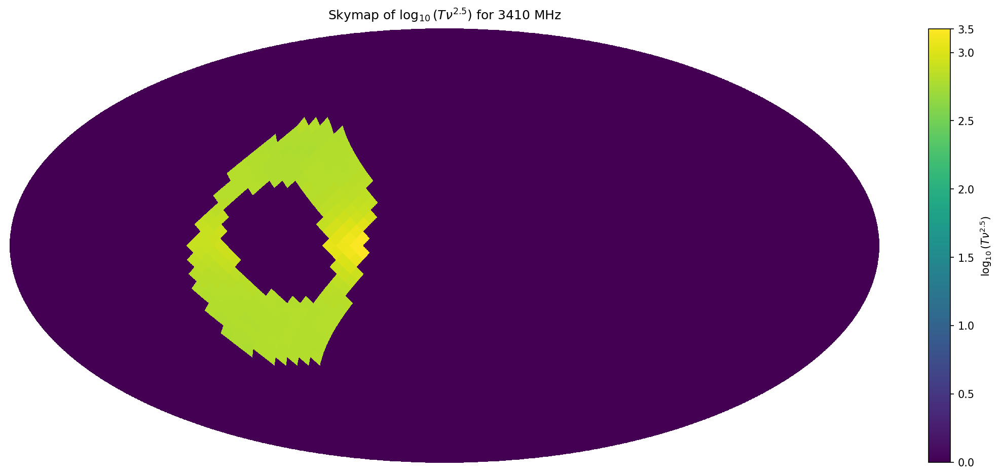

In [8]:
i_nu = 10
plt.subplots(1,1,figsize=(16,8),dpi = 150)
#map = np.log10((np.sqrt(1/inv_cov[i_nu])) * (int(nu_list[i_nu]) ** 2.5))
map = skymaps[i_nu]
hp.mollview(map, xsize = 4000, nest = False, hold = True, 
            #min = 7.2, max = 9.2, cmap = 'inferno', 
            title=r"Skymap of $\log_{10}(T \nu ^{2.5})$ for " + nu_list[i_nu] +  " MHz", 
            badcolor = 'white', cbar = None)

fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cbar = fig.colorbar(image, ax=ax,fraction=0.023)
cbar.set_label(r'$\log_{10}(T \nu^{2.5})$')

## Masking

In [9]:
# minimum latitude and longitudes we consider
B_MIN = 10
L_MIN = 0

# load source template 

pt_src = np.load(DataDir + 'pt_src.npy')
vlbi_src = np.load(DataDir + 'vlbi_src_mask.npy')
pt_src_dg = hp.ud_grade(pt_src, resol)
vlbi_src_dg = hp.ud_grade(vlbi_src, resol)


# chop up the maps so only 4 quadrants remain
# mask out point sources according to pt_tmpl

for i in range(len(nu_list)):
    skymaps[i] = remove_sky(skymaps[i], B_MIN, L_MIN)
    #skymaps[i][pt_src_dg > 0] = np.nan
    #skymaps[i][vlbi_src_dg > 0] = np.nan

    inv_cov[i] = remove_sky(inv_cov[i], B_MIN, L_MIN)
    #inv_cov[i][pt_src_dg > 0] = np.nan
    #inv_cov[i][vlbi_src_dg > 0] = np.nan

    

In [10]:
pix_list = remove_sky(pix_list, B_MIN, L_MIN)
#pix_list[pt_src_dg > 0] = np.nan
#pix_list[vlbi_src_dg > 0] = np.nan

/tmp/ipykernel_1830004/1571642577.py:4: RuntimeWarning: invalid value encountered in sqrt
  map = np.log10((np.sqrt(1/inv_cov[i_nu])) * (int(nu_list[i_nu]) ** 2.5))


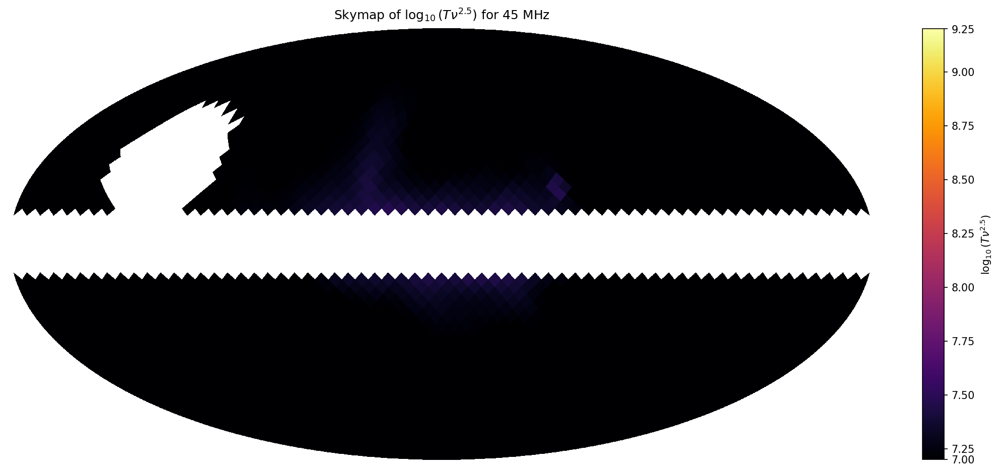

In [11]:
i_nu = 2

plt.subplots(1,1,figsize=(16,8),dpi = 150)
map = np.log10((np.sqrt(1/inv_cov[i_nu])) * (int(nu_list[i_nu]) ** 2.5))
hp.mollview(map, xsize = 4000, nest = False, hold = True, 
            min = 7.2, max = 9.2, cmap = 'inferno', 
            title=r"Skymap of $\log_{10}(T \nu ^{2.5})$ for " + nu_list[i_nu] +  " MHz", 
            badcolor = 'white', cbar = None)

fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cbar = fig.colorbar(image, ax=ax,fraction=0.023);
cbar.set_label(r'$\log_{10}(T \nu^{2.5})$')

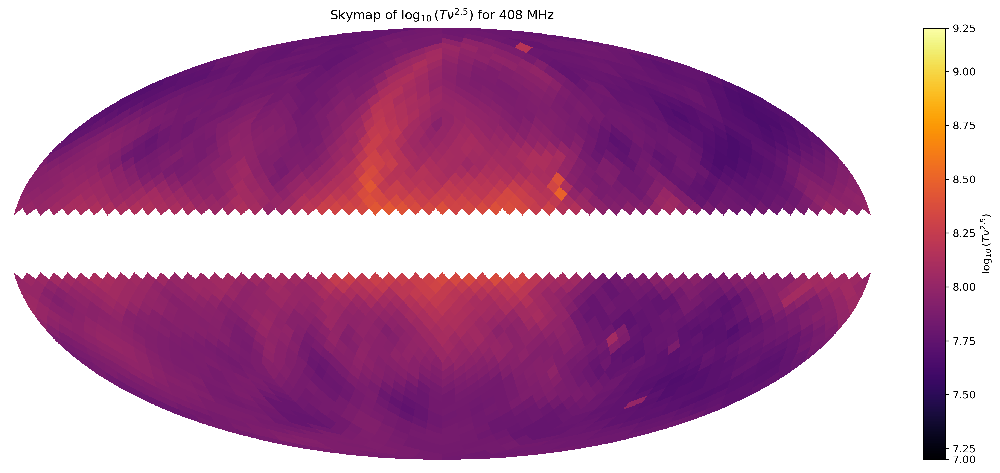

In [12]:
i_nu = 7

plt.subplots(1,1,figsize=(16,8),dpi = 300)
map = np.log10((skymaps[i_nu]) * (int(nu_list[i_nu]) ** 2.5))
hp.mollview(map, xsize = 4000, nest = False, hold = True, 
            min = 7.2, max = 9.2, cmap = 'inferno', 
            title=r"Skymap of $\log_{10}(T \nu ^{2.5})$ for " + nu_list[i_nu] +  " MHz", 
            badcolor = 'white', cbar = None)

fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cbar = fig.colorbar(image, ax=ax,fraction=0.023)
cbar.set_label(r'$\log_{10}(T \nu^{2.5})$')

In [13]:
len(skymaps[2][skymaps[2]==0])

99

In [14]:
num_pix_r = len(skymaps[0][~np.isnan(skymaps[0])]); num_pix_r

2496

# Exclude NAN values

In [15]:
skymaps_r = np.zeros((len(nu_list), num_pix_r))
inv_cov_r = np.zeros((len(nu_list), num_pix_r))


for i_f, f in enumerate(nu_list):
    skymaps_r[i_f] = skymaps[i_f][~np.isnan(skymaps[i_f])]
    inv_cov_r[i_f] = inv_cov[i_f][~np.isnan(inv_cov[i_f])]

In [16]:
pix_list = pix_list[~np.isnan(pix_list)]
pix_list = np.asarray(pix_list, dtype = 'int')

In [17]:
len(pix_list)

2496

# Likelihood Function

Our likelihood function is

$$-2\ln\mathcal{L} = \sum_q \sum_{i,j} [T_i - ( T_{\mathrm{CMB}} + T_E \nu^{\beta_E} + T_{G,i}\csc|b_i|\nu^{\beta_{\mathrm{synch},i}})]\Sigma_{ij}^{-1} [T_j - (T_{\mathrm{CMB}} + T_E \nu^{\beta_E} + T_{G,j}\csc|b_j|\nu^{\beta_{\mathrm{synch},j}})]$$

# Precomputations

In [55]:
#number of b bins per hemisphere
num_b = 10
b_bins = np.arange(-90, 90, 180/(num_b))

# latitudes
_, lat = hp.pix2ang(resol, pix_list, nest = False, lonlat = True)
# b bin assignments
b_assgn = np.digitize(lat, bins = b_bins)
#b_bins = np.concatenate((b_bins, [90]))
b_bins, b_assgn

(array([-90., -72., -54., -36., -18.,   0.,  18.,  36.,  54.,  72.]),
 array([10, 10, 10, ...,  1,  1,  1]))

In [56]:
csc_i = 1/np.sin(np.abs(lat) * degree)

## Covariance "matrix"

In [57]:
'''# This array (Nmaps x Npix) encodes the principal diagonal of the covariance matrix for each map

# rms noise
rms_arr = np.broadcast_to(rms_list, (len(csc_i),len(rms_list))).T

# calibration error
calib_arr = np.broadcast_to(calib_list, (len(csc_i),len(calib_list))).T
calib_arr = calib_arr * skymaps_r


# variance
var_i_q = rms_arr**2 + calib_arr**2

# inverse covariance "matrix"
inv_cov = 1/var_i_q

for i_f in range(len(inv_cov[:,0])):
    inv_cov[i_f][skymaps_r[i_f]==0] = 0'''

'# This array (Nmaps x Npix) encodes the principal diagonal of the covariance matrix for each map\n\n# rms noise\nrms_arr = np.broadcast_to(rms_list, (len(csc_i),len(rms_list))).T\n\n# calibration error\ncalib_arr = np.broadcast_to(calib_list, (len(csc_i),len(calib_list))).T\ncalib_arr = calib_arr * skymaps_r\n\n\n# variance\nvar_i_q = rms_arr**2 + calib_arr**2\n\n# inverse covariance "matrix"\ninv_cov = 1/var_i_q\n\nfor i_f in range(len(inv_cov[:,0])):\n    inv_cov[i_f][skymaps_r[i_f]==0] = 0'

In [58]:
## nu array
nu_ = np.asarray([float(n) for n in nu_list]) / 310 # reference frequency 310 MHz
nu_arr = np.broadcast_to(nu_, (len(csc_i),len(nu_list))).T

In [59]:
# dimensionality of our problem : 2 + 2 * num_b

ndim = 2 + 2 * num_b + 1
print ('ndim = ' + str(ndim))

ndim = 23


In [60]:
def loglike(x):
    # extragalactic parameters
    T_CMB =  x[0] #2.722
    T_E =  x[1] #30.4 #
    beta_E = x[2] #-2.58 # 
    
    # galactic parameters
    T_G  =  x[3 : (2 + num_b)+1] #np.asarray([9.65,8.06]) #
    
    beta_G = x[(2 + num_b)+1 : (2 + 2 * num_b)+1] # np.asarray([-2.58, -2.56])#
    
    # isotropic component
    TE_i = T_E * np.ones(num_pix_r) 
    nu_beta_E = np.power(nu_, beta_E)
    TE_i_q = np.outer(nu_beta_E, TE_i)

    # galactic component
    TG_csc_i = T_G[b_assgn-1] * csc_i
    nu_beta_G = np.power(nu_arr, beta_G[b_assgn-1])
    TG_i_q = TG_csc_i * nu_beta_G
    
    # residual array
    res_arr = inv_cov_r * (skymaps_r - (T_CMB + TE_i_q + TG_i_q))**2
    
    # contract over pixel and map indices
    return -0.5 * np.einsum('qi->', res_arr) 

In [61]:
# instiantiate array with priors

scale = np.zeros(ndim) # size of prior
shift = np.zeros(ndim) # location of prior

scale[0] = 0.5
scale[1] = 35
scale[2] = 0.3
scale[3: (2 + num_b)+1] = 15
scale[(2 + num_b)+1 : (2 + 2 * num_b)+1] = 0.5

shift[0] = 2.5
shift[1] = 0
shift[2] = -2.7
shift[3: (2 + num_b)+1] = 0
shift[(2 + num_b)+1 : (2 + 2 * num_b)+1] = -2.7

In [62]:
def ptform(u):
    return scale * u + shift

In [63]:
# parallelize
from multiprocessing import Pool

num_cores = 40

pool = Pool(num_cores)

In [64]:
import dynesty

# "Dynamic" nested sampling.
dsampler = dynesty.DynamicNestedSampler(loglike, ptform, ndim, pool = pool, queue_size = num_cores, sample='auto')
dsampler.run_nested()
dresults = dsampler.results

46157it [04:44, 162.04it/s, batch: 2 | bound: 4 | nc: 130 | ncall: 6244639 | eff(%):  0.739 | loglstar: -36633.662 < -36625.520 < -36632.518 | logz: -36700.926 +/-  0.324 | stop:  0.951]     


In [72]:
from dynesty import utils as dyfunc

results = dresults

In [73]:
# Extract sampling results.
samples = results.samples  # samples
weights = np.exp(results.logwt - results.logz[-1])  # normalized weights

# Compute 1 sigma error bars
quantiles = [dyfunc.quantile(samps, [0.159,0.5,0.841], weights=weights)
             for samps in samples.T]

# Compute weighted mean and covariance.
mean, cov = dyfunc.mean_and_cov(samples, weights)

# Resample weighted samples.
samples_equal = dyfunc.resample_equal(samples, weights)

# Generate a new set of results with sampling uncertainties.
results_sim = dyfunc.resample_run(results)

In [74]:
std_devs = np.asarray([max(quantiles[i][2] - quantiles[i][1], quantiles[i][1] - quantiles[i][0]) for i in range(len(quantiles))])
std_devs

array([3.11533027e-04, 3.63178656e-01, 2.62779212e-03, 6.59042122e-01,
       4.41755499e-01, 2.93502089e-01, 1.64080780e-01, 1.05335830e-01,
       1.05683163e-01, 1.72234682e-01, 2.86257748e-01, 4.12191321e-01,
       6.10310883e-01, 4.01555209e-02, 3.35525533e-02, 1.61752591e-02,
       7.54390790e-03, 5.84515947e-03, 4.88318831e-03, 7.41155281e-03,
       1.13066924e-02, 1.42571902e-02, 2.35154160e-02])

In [75]:
label_list = ['' for i in range(0,ndim)]

label_list[0] = r'CMB [K]'
label_list[1] = r'$T_E$ [K]'
label_list[2] = r'$\beta_E$'
#label_list[3] = r'$T_{gal}$ S. Hem.'
#label_list[4] = r'$T_{gal}$ N. Hem.'


ndim

23

In [76]:
quantiles

[[2.726928646262289, 2.727229637678855, 2.727541170705438],
 [30.137752834200715, 30.4990267589674, 30.862205415270743],
 [-2.5720030673848746, -2.5693752752621015, -2.5667511381750168],
 [7.4689096329503615, 8.127951754573555, 8.77946385217948],
 [4.881554918844472, 5.319976344563744, 5.761731843238256],
 [5.544002826273247, 5.836988639959717, 6.130490728792649],
 [5.499286754808514, 5.663367535119077, 5.827105356813313],
 [5.932363973633061, 6.037699803689028, 6.142387306603274],
 [7.237325625897436, 7.341376172147268, 7.447059335294595],
 [6.324270614250313, 6.49650529637369, 6.6642244770372905],
 [7.639096744480176, 7.92535449249517, 8.202483857357047],
 [10.048313491301473, 10.458844838140543, 10.87103615920457],
 [10.853294004835547, 11.463604887588287, 12.065638105303009],
 [-2.3691508305864617, -2.3289953097275795, -2.28977095189528],
 [-2.335630818606518, -2.3020782652614415, -2.2686738592275506],
 [-2.473974159803016, -2.457894053082943, -2.4417187939671057],
 [-2.58622080272

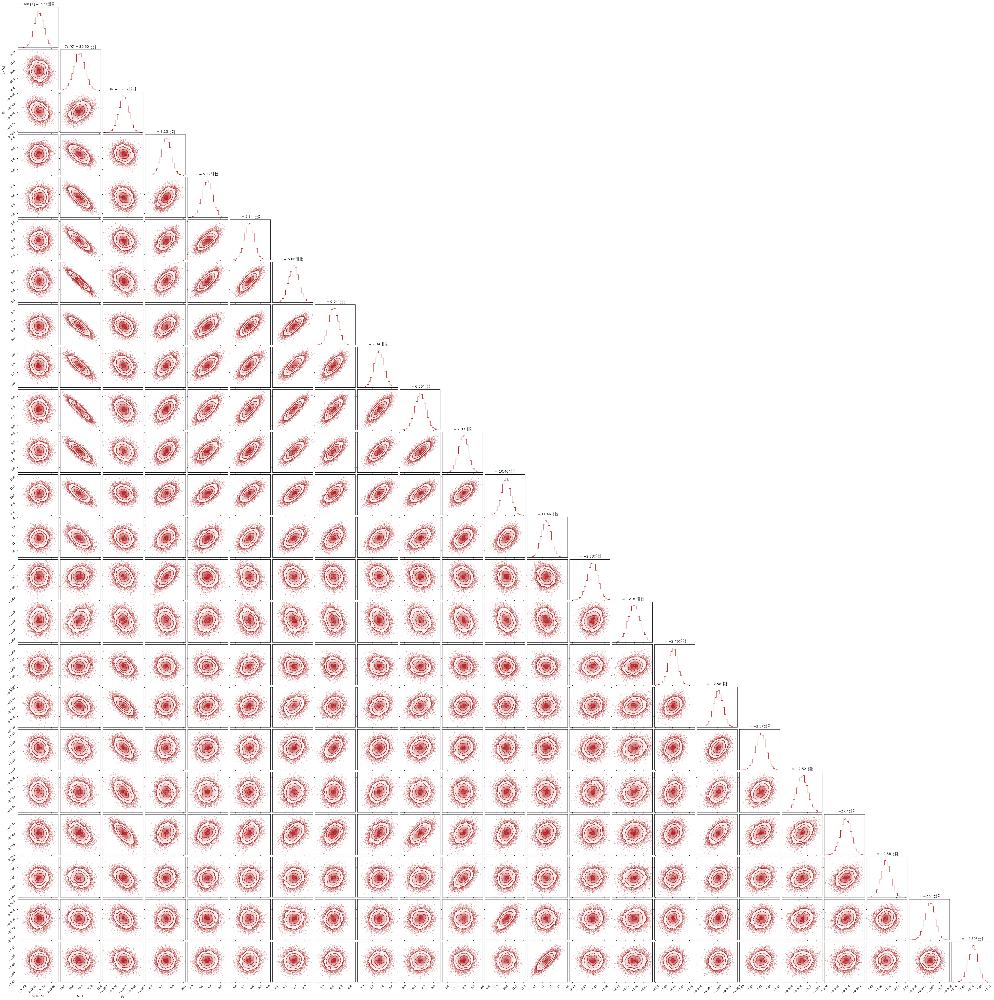

In [77]:
import corner
fig = corner.corner(samples_equal, 
                    bins=25, 
                    show_titles = True,
                    color = 'firebrick', 
                    labels = label_list,
                    hist_kwargs={'density': True})


In [78]:
np.save('samples_equal.npy', samples_equal) # save sampling for plotting

In [35]:
samples_equal.shape

(25681, 7)

# Scratch work

In [ ]:
from pickletools import optimize
from numba import njit


def chisq(x):
    # extragalactic parameters
    T_E = x[0] ; beta_E = x[1]
    
    # galactic parameters
    T_G  = x[2 : (2 + num_b)] ; beta_G = x[(2 + num_b) : (2 + 2 * num_b)]
    
    # isotropic component
    TE_i = T_E * np.ones(num_pix_r) 
    nu_beta_E = np.power(nu_, beta_E)
    TE_i_q = np.outer(nu_beta_E, TE_i)

    # galactic component
    TG_csc_i = T_G[b_assgn-1] * csc_i
    nu_beta_G = np.power(nu_arr, beta_G[b_assgn-1])
    TG_i_q = TG_csc_i * nu_beta_G
    
    # residual array
    res_arr = np.asarray(inv_cov_r * (skymaps_r - (TE_i_q + TG_i_q))**2, dtype = 'float')
    
    # contract over pixel and map indices
    return np.einsum('iq->', res_arr)

In [ ]:
@njit
def chisq2(x):
    # extragalactic parameters
    T_E = x[0] ; beta_E = x[1]
    
    # galactic parameters
    T_G  = x[2 : (2 + num_b)] ; beta_G = x[(2 + num_b) : (2 + 2 * num_b)]
    
    # isotropic component
    TE_i = T_E * np.ones((num_maps, num_pix_r) )
    nu_beta_E = np.power(nu_arr, beta_E)
    TE_i_q = nu_beta_E * TE_i

    # galactic component
    TG_csc_i = T_G[b_assgn-1] * csc_i
    nu_beta_G = np.power(nu_arr, beta_G[b_assgn-1])
    TG_i_q = TG_csc_i * nu_beta_G
    
    # residual array
    res_arr = np.asarray(inv_cov_r * (skymaps_r - (TE_i_q + TG_i_q))**2, dtype = 'float')
    
    # contract over pixel and map indices
    return np.einsum('iq->', res_arr)

In [ ]:
x0 = np.zeros(ndim) # size of prior
x0[0] = 20
x0[1] = -2.6
x0[2: (2 + num_b)] = 10
x0[(2 + num_b) : (2 + 2 * num_b)] = -3

x0

In [ ]:
chisq2(x0)

In [ ]:
chisq(x0)

In [ ]:
%timeit -n 20 chisq(x0) 

In [ ]:
%timeit -n 20 chisq2(x0) 

In [ ]:
from scipy.optimize import minimize

options = {"maxiter": 100000}
res = minimize(chisq, x0, method = 'Nelder-Mead', options = options)

print('T_E: ' + str(res.x[0]))
print('beta_E : ' + str(res.x[1]))

print('T_G : ' + str(res.x[2: (2 + num_b)]))
print('beta_G : ' + str(res.x[(2 + num_b) : (2 + 2 * num_b)]))

In [ ]:
res.success

In [ ]:
res = minimize(chisq, x0, options = options)

print('T_E: ' + str(res.x[0]))
print('beta_E : ' + str(res.x[1]))

print('T_G : ' + str(res.x[2: (2 + num_b)]))
print('beta_G : ' + str(res.x[(2 + num_b) : (2 + 2 * num_b)]))

In [ ]:
res.success

In [ ]:
res